Installing Kaggle Library



In [ ]:
!pip install q kaggle

# Install Libraries

In [ ]:
from google.colab import files
import pandas as pd
import numpy as np
from google.colab import autoviz
import seaborn as sns


# Kaggle Json Api File


In [ ]:
# Import necessary libraries
import os
import json

# Define your Kaggle API credentials
kaggle_credentials = {
    "username": "bhargav29",
    "key": "5088b4e2af146ce92409abbac2bd3399"
}

# Create the .kaggle directory in the root if it doesn't exist
os.makedirs(os.path.expanduser("~/.kaggle"), exist_ok=True)

# Define the path to the kaggle.json file
kaggle_json_path = os.path.expanduser("~/.kaggle/kaggle.json")

# Write the Kaggle API credentials to the kaggle.json file
with open(kaggle_json_path, 'w') as f:
    json.dump(kaggle_credentials, f)

# Change the file permissions to read and write only for the user
os.chmod(kaggle_json_path, 0o600)

# Verify that the kaggle.json file has been created and has the correct permissions
!ls -l ~/.kaggle/kaggle.json


-rw------- 1 root root 68 Jun 11 17:42 /root/.kaggle/kaggle.json


### Change the permission

In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

### Check the dataset


In [ ]:
!kaggle datasets download -d hasibalmuzdadid/shoe-vs-sandal-vs-boot-dataset-15k-images

Dataset URL: https://www.kaggle.com/datasets/hasibalmuzdadid/shoe-vs-sandal-vs-boot-dataset-15k-images
License(s): copyright-authors
 87% 41.0M/47.0M [00:00<00:00, 61.9MB/s]
100% 47.0M/47.0M [00:00<00:00, 55.3MB/s]


! unzip /content/shoe-vs-sandal-vs-boot-dataset-15k-images.zip

In [ ]:
! unzip /content/shoe-vs-sandal-vs-boot-dataset-15k-images.zip

Streaming output truncated to the last 5000 lines.
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (10).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (100).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1000).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1001).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1002).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1003).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1004).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1005).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1006).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1007).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1008).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (1009).jpg  
  inflating: Shoe vs Sandal vs Boot Dataset/Shoe/Shoe (101).jpg  
  inflating: Shoe 

# Saving the data in a frame

Class 'Sandal': Train=3500, Validation=750, Test=750
Class 'Boot': Train=3500, Validation=750, Test=750
Class 'Shoe': Train=3500, Validation=750, Test=750
Total Classes: 3
Total Images - Train: 10500, Validation: 2250, Test: 2250
Dataset split into train, validation, and test sets successfully.


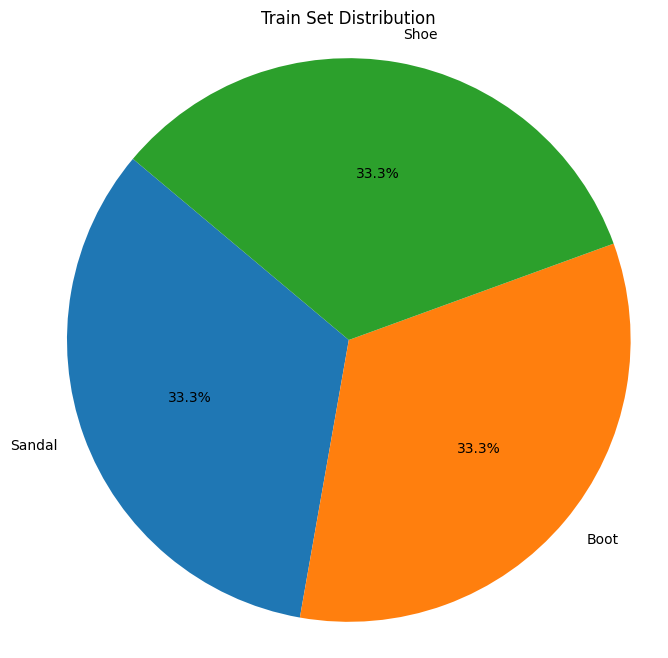

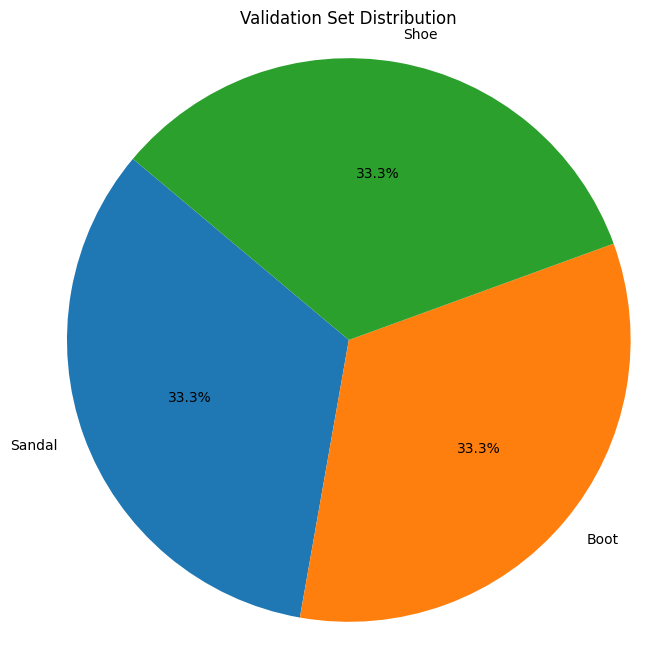

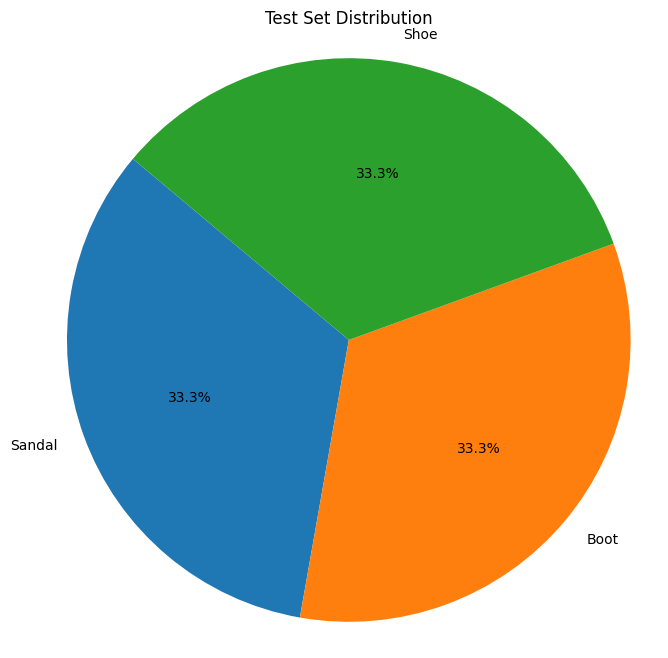

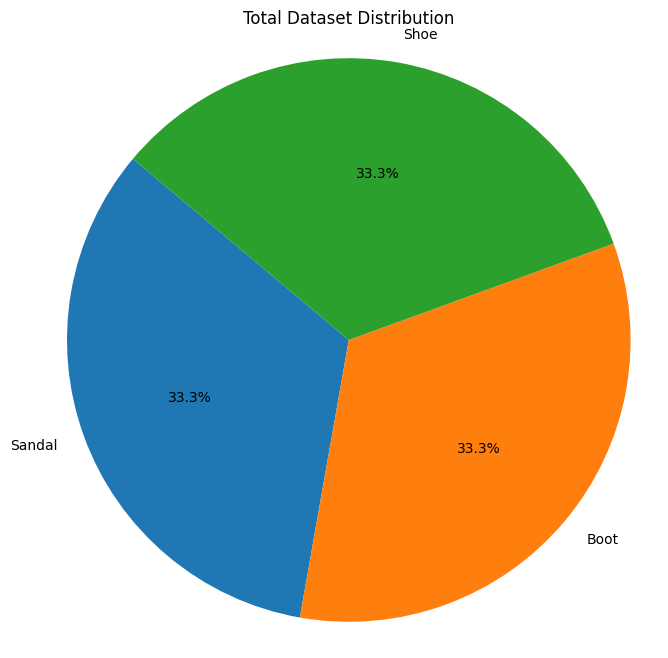

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define the main directory path and output directories
main_directory = '/content/Shoe vs Sandal vs Boot Dataset'
output_directories = {
    'train': '/content/train',
    'validation': '/content/validation',
    'test': '/content/test'
}

# Create output directories if they don't exist
for dir_path in output_directories.values():
    os.makedirs(dir_path, exist_ok=True)

# Get sub-folders (classes) in the main directory
sub_folders = [f for f in os.listdir(main_directory) if os.path.isdir(os.path.join(main_directory, f))]

total_images = {'train': 0, 'validation': 0, 'test': 0}
class_counts = {'train': {}, 'validation': {}, 'test': {}, 'total': {}}

for sub_folder in sub_folders:
    full_sub_folder_path = os.path.join(main_directory, sub_folder)
    images = [f for f in os.listdir(full_sub_folder_path) if os.path.isfile(os.path.join(full_sub_folder_path, f))]

    if not images:
        print(f"No images found in class '{sub_folder}', skipping this class.")
        continue

    train_images, temp_images = train_test_split(images, test_size=0.3, random_state=42)
    val_images, test_images = train_test_split(temp_images, test_size=0.5, random_state=42)

    for set_name, set_images in zip(['train', 'validation', 'test'], [train_images, val_images, test_images]):
        os.makedirs(os.path.join(output_directories[set_name], sub_folder), exist_ok=True)
        for image in set_images:
            shutil.copy(os.path.join(full_sub_folder_path, image), os.path.join(output_directories[set_name], sub_folder, image))
        total_images[set_name] += len(set_images)
        class_counts[set_name][sub_folder] = len(set_images)

    class_counts['total'][sub_folder] = len(images)

    print(f"Class '{sub_folder}': Train={len(train_images)}, Validation={len(val_images)}, Test={len(test_images)}")

print(f"Total Classes: {len(sub_folders)}")
print(f"Total Images - Train: {total_images['train']}, Validation: {total_images['validation']}, Test: {total_images['test']}")
print("Dataset split into train, validation, and test sets successfully.")

# Function to generate pie charts
def generate_pie_chart(data, title):
    labels = data.keys()
    sizes = data.values()
    plt.figure(figsize=(8, 8))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')
    plt.title(title)
    plt.show()

# Generate pie charts
generate_pie_chart(class_counts['train'], 'Train Set Distribution')
generate_pie_chart(class_counts['validation'], 'Validation Set Distribution')
generate_pie_chart(class_counts['test'], 'Test Set Distribution')
generate_pie_chart(class_counts['total'], 'Total Dataset Distribution')


### Here we can see that the Class Distribution of Training and The Test Data is Uniformly distributed. Out of total data of 15,000 Images. Each Shoe, Sandal , Boot is 5,000 images each.

### **Training Data - 10,500 Images**
### **Validation Data - 2,250 Images**
### **Test Data - 2,250 Images**

# Matrix of some sample images

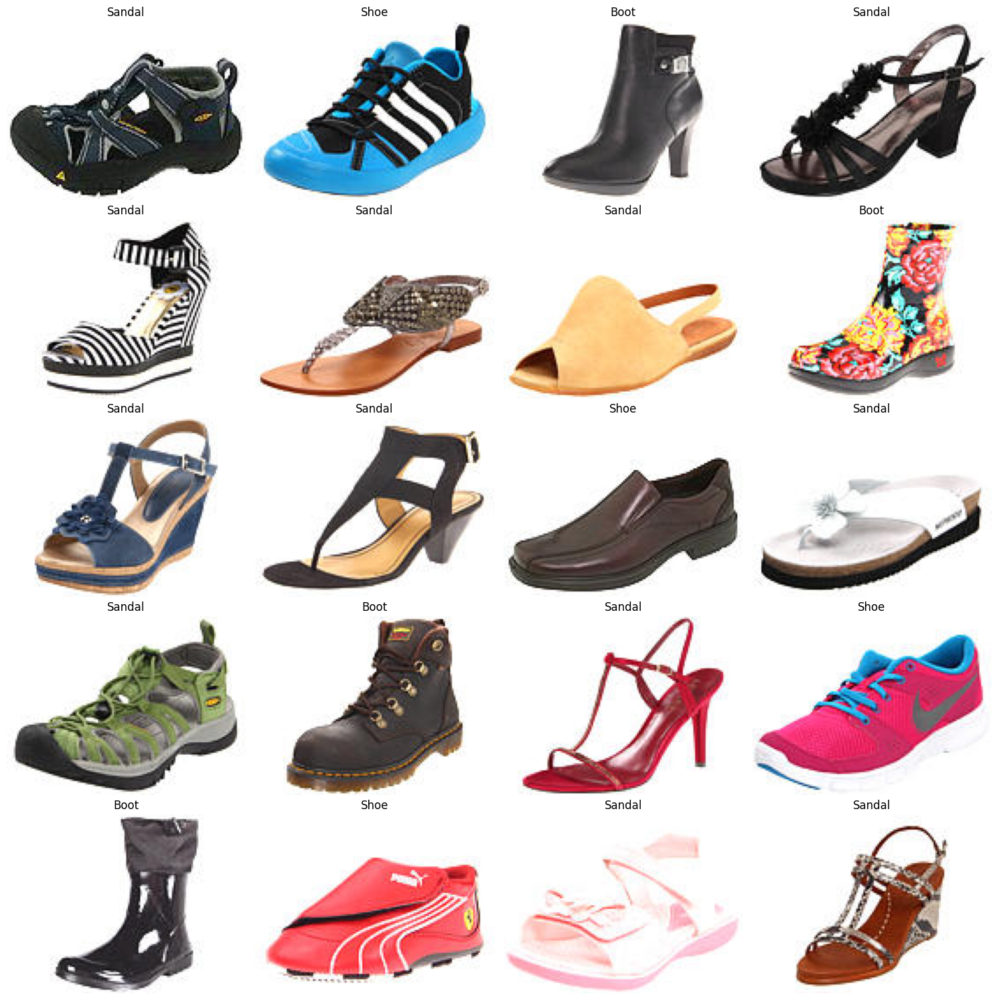

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Define the train directory path
train_directory = '/content/train'

# Get the list of sub-folders (classes) in the train directory
sub_folders = [f for f in os.listdir(train_directory) if os.path.isdir(os.path.join(train_directory, f))]

# Collect paths of all images in the train directory
all_train_images = []
for sub_folder in sub_folders:
    full_sub_folder_path = os.path.join(train_directory, sub_folder)
    images = [os.path.join(full_sub_folder_path, f) for f in os.listdir(full_sub_folder_path) if os.path.isfile(os.path.join(full_sub_folder_path, f))]
    all_train_images.extend(images)

# Select 20 random images from the train dataset
random_images = random.sample(all_train_images, 20)

# Plot the images in a 5x4 matrix
fig, axes = plt.subplots(5, 4, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax in zip(random_images, axes):
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(os.path.basename(os.path.dirname(img_path)))

plt.tight_layout()
plt.show()


## Initializing GridSearchtuner for implementing GridSearch CV on our Models,
Unfortunately running this code on Google Collab was Computiationally very expensive and takes an extended duration of time. So I have done and implemented it locally and got the best configuration possible. Now running the current model with the same configuration

### Visualizing Randomly few Images

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
import os


## Model ResNet152V2

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D as GAP, Dense, Dropout
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from datetime import datetime
import os
import pandas as pd

# Define paths
train_directory = '/content/train'
test_directory = '/content/test'
validation_directory = '/content/validation'

# Initialize Generator
gen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    rotation_range=20
)

# Load Training Data
train_ds = gen.flow_from_directory(
    train_directory,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    shuffle=True
)

# Load Validation Data
valid_ds = gen.flow_from_directory(
    validation_directory,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    shuffle=True
)

# Load Test Data
test_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_ds = test_gen.flow_from_directory(
    test_directory,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    shuffle=False  # No need to shuffle test data
)

# Set Name
name = "ResNet"

# Load Pretrained Model
base_model = ResNet152V2(include_top=False, weights='imagenet', input_shape=(256,256,3))
base_model.trainable = False

# Create Model
n_classes = len(train_ds.class_indices)  # Number of classes
resnet = Sequential([
    base_model,
    GAP(),
    Dense(384, activation='relu'),
    Dropout(0.4),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(n_classes, activation='softmax')
], name=name)

# Compile Model
resnet.compile(
    loss='categorical_crossentropy',  # Use 'categorical_crossentropy' for multi-class classification
    optimizer='adam',
    metrics=['accuracy', 'Precision', 'Recall', 'AUC']
)

# Callbacks
log_dir = os.path.join("logs", name + "_" + datetime.now().strftime("%Y%m%d-%H%M%S"))
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True),
    TensorBoard(log_dir=log_dir, histogram_freq=1)
]

# Train Model
history = resnet.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=50,
    callbacks=cbs
)

# Evaluate Model
evaluation_results = resnet.evaluate(test_ds)
evaluation_df = pd.DataFrame([evaluation_results], columns=resnet.metrics_names)
print(evaluation_df)

# Launch TensorBoard
%load_ext tensorboard
%tensorboard --logdir logs


Found 10500 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.
Found 2250 images belonging to 3 classes.
234545216/234545216 [==============================] - 2s 0us/step
Epoch 1/50
329/329 [==============================] - ETA: 0s - loss: 0.2178 - accuracy: 0.9199 - precision: 0.9261 - recall: 0.9140 - auc: 0.9867

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


329/329 [==============================] - 306s 878ms/step - loss: 0.2178 - accuracy: 0.9199 - precision: 0.9261 - recall: 0.9140 - auc: 0.9867 - val_loss: 0.0972 - val_accuracy: 0.9649 - val_precision: 0.9673 - val_recall: 0.9604 - val_auc: 0.9968
Epoch 2/50
329/329 [==============================] - 242s 736ms/step - loss: 0.1386 - accuracy: 0.9493 - precision: 0.9521 - recall: 0.9467 - auc: 0.9941 - val_loss: 0.0889 - val_accuracy: 0.9698 - val_precision: 0.9744 - val_recall: 0.9658 - val_auc: 0.9973
Epoch 3/50
329/329 [==============================] - 239s 726ms/step - loss: 0.1038 - accuracy: 0.9627 - precision: 0.9652 - recall: 0.9607 - auc: 0.9962 - val_loss: 0.0921 - val_accuracy: 0.9693 - val_precision: 0.9710 - val_recall: 0.9684 - val_auc: 0.9961
Epoch 4/50
329/329 [==============================] - 238s 724ms/step - loss: 0.0944 - accuracy: 0.9677 - precision: 0.9700 - recall: 0.9660 - auc: 0.9969 - val_loss: 0.0842 - val_accuracy: 0.9707 - val_precision: 0.9737 - val_reca

<IPython.core.display.Javascript object>

#InceptionV3

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D as GAP, Dense, Dropout
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from datetime import datetime
import os
import pandas as pd

# Define paths
train_directory = '/content/train'
test_directory = '/content/test'
validation_directory = '/content/validation'

# Initialize Generator
gen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    rotation_range=20
)

# Load Training Data
train_ds = gen.flow_from_directory(
    train_directory,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    shuffle=True
)

# Load Validation Data
valid_ds = gen.flow_from_directory(
    validation_directory,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    shuffle=True
)

# Load Test Data
test_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_ds = test_gen.flow_from_directory(
    test_directory,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',  # Use 'categorical' for multi-class classification
    shuffle=False  # No need to shuffle test data
)

# Set Name
name = "InceptionV3"

# Load Pretrained Model
base_model = InceptionV3(include_top=False, weights='imagenet', input_shape=(256,256,3))
base_model.trainable = False

# Create Model
n_classes = len(train_ds.class_indices)  # Number of classes
model = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu'),  # Dense Units (Layer 1): 256
    Dropout(0.4),  # Dropout Rate (Layer 1): 0.4
    Dense(128, activation='relu'),  # Dense Units (Layer 2): 128
    Dropout(0.3),  # Dropout Rate (Layer 2): 0.3
    Dense(n_classes, activation='softmax')
], name=name)

# Compile Model
model.compile(
    loss='categorical_crossentropy',  # Use 'categorical_crossentropy' for multi-class classification
    optimizer='RMSprop',  # Optimizer: RMSprop
    metrics=['accuracy', 'Precision', 'Recall', 'AUC']
)

# Callbacks
log_dir = os.path.join("logs", name + "_" + datetime.now().strftime("%Y%m%d-%H%M%S"))
cbs = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ModelCheckpoint(name + ".h5", save_best_only=True),
    TensorBoard(log_dir=log_dir, histogram_freq=1)
]

# Train Model
history = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=50,
    callbacks=cbs
)

# Evaluate Model
evaluation_results = model.evaluate(test_ds)
evaluation_df = pd.DataFrame([evaluation_results], columns=model.metrics_names)
print(evaluation_df)

# Launch TensorBoard
%load_ext tensorboard
%tensorboard --logdir logs
